# Decoding Sector Valuation Dynamics

Exploring the Nexus of Company Fundamentals, Economic Indicators, and Equity Valuations via Predictive Analytics

## Materials Sector

In [1]:
from utils import Utils
import pandas as pd
import numpy as np

SECTOR = 'Materials'

%matplotlib inline

# Import data
df = pd.read_csv('data/feature_selection.csv')
df = df.query(f'`GICS Sector` == "{SECTOR}"')

utils = Utils()

df, features, target = utils.init_df(df)

utils.df_sector_info(df)

Shape: (9307, 63)
Earnings: 2662 (28.60%)
Companies: 85


,Total,Total %,Earnings,Earnings %,Earnings % of Total
cap,,,,,
small,3223,34.63,850,26.37,31.93
large,3094,33.24,909,29.38,34.15
mid,2990,32.13,903,30.20,33.92


,Total,Total %,Earnings,Earnings %,Earnings % of Total
GICS Industry Group,,,,,
Materials,9307,100.0,2662,28.6,100.0


Total  Total %  Earnings  \
GICS Industry Group GICS Industry                                       
Materials           Chemicals                 4161    44.71      1174   
                    Construction Materials     369     3.96       122   
                    Containers & Packaging    1898    20.39       541   
                    Metals & Mining           2494    26.80       707   
                    Paper & Forest Products    385     4.14       118   

                                             Earnings %  Earnings % of Total  
GICS Industry Group GICS Industry                                             
Materials           Chemicals                     28.21                44.10  
                    Construction Materials        33.06                 4.58  
                    Containers & Packaging        28.50                20.32  
                    Metals & Mining               28.35                26.56  
                    Paper & Forest Products       30.65                 4.43

Total  \
GICS Industry           GICS Sub-Industry                                       
Chemicals               Commodity Chemicals                               362   
                        Diversified Chemicals                             463   
                        Fertilizers & Agricultural Chemicals              535   
                        Industrial Gases                                  241   
                        Specialty Chemicals                              2560   
Construction Materials  Construction Materials                            369   
Containers & Packaging  Metal, Glass & Plastic Containers                 712   
                        Paper & Plastic Packaging Products & Materials   1186   
Metals & Mining         Aluminum                                          341   
                        Copper                                            121   
                        Diversified Metals & Mining                       278   
                        Gold                                              228   
                        Steel                                            1526   
Paper & Forest Products Forest Products                                   240   
                        Paper Products                                    145   

                                                                        Total %  \
GICS Industry           GICS Sub-Industry                                         
Chemicals               Commodity Chemicals                                3.89   
                        Diversified Chemicals                              4.97   
                        Fertilizers & Agricultural Chemicals               5.75   
                        Industrial Gases                                   2.59   
                        Specialty Chemicals                               27.51   
Construction Materials  Construction Materials                             3.96   
Containers & Packaging  Metal, Glass & Plastic Containers                  7.65   
                        Paper & Plastic Packaging Products & Materials    12.74   
Metals & Mining         Aluminum                                           3.66   
                        Copper                                             1.30   
                        Diversified Metals & Mining                        2.99   
                        Gold                                               2.45   
                        Steel                                             16.40   
Paper & Forest Products Forest Products                                    2.58   
                        Paper Products                                     1.56   

                                                                        Earnings  \
GICS Industry           GICS Sub-Industry                                          
Chemicals               Commodity Chemicals                                   84   
                        Diversified Chemicals                                150   
                        Fertilizers & Agricultural Chemicals                 169   
                        Industrial Gases                                      61   
                        Specialty Chemicals                                  710   
Construction Materials  Construction Materials                               122   
Containers & Packaging  Metal, Glass & Plastic Containers                    180   
                        Paper & Plastic Packaging Products & Materials       361   
Metals & Mining         Aluminum                                              79   
                        Copper                                                40   
                        Diversified Metals & Mining                           80   
                        Gold                                                  58   
                        Steel                                                450   
Paper & Forest Product

In [2]:
# Lets see if there are any features that are null for nearly all the earnings reports
utils.feat_nulls(df)

(2662, 63)


,Nulls,Null %
R&D to Revenue,1725,64.80
avg_home_price,1539,57.81
gdp_real,1288,48.38
federal_budget_deficit,535,20.10
Inventory Turnover,501,18.82
...,...,...
Cash Flow to Debt,0,0.00
Assets to Equity,0,0.00
cap,0,0.00
Financing CF to OCF,0,0.00


In [3]:
features, _ = utils.features(df)

### Distribution of Target

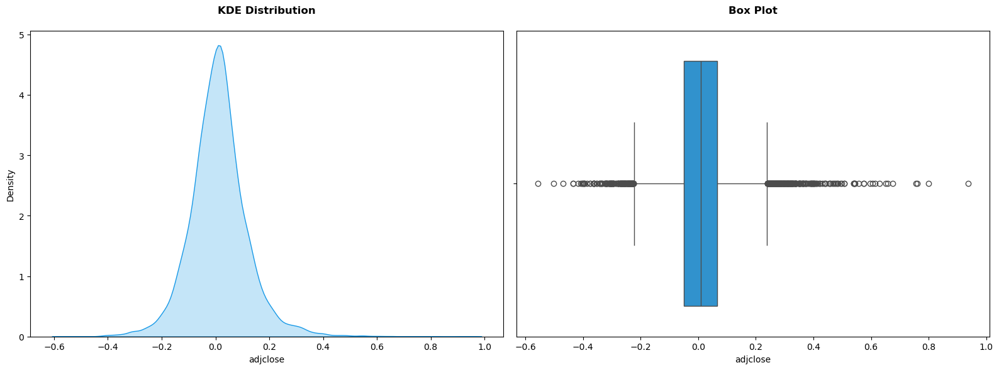

In [4]:
# Plot the distribution of the target
utils.plot.dist(df[target])

The target distribution is not too skewed, lets take a look at the bottom and top of the distribution to see what may be causing some of the outliers. The bottom of the distribution may reveal companies that were in a period of financial distress (bankruptcy, scandal, etc.).

In [5]:
# Top of the distribution
df.nlargest(15, target)

,symbol,cap,GICS Sector,GICS Industry Group,GICS Industry,GICS Sub-Industry,date,adjclose,TotalRevenue,OperatingRevenue,NetIncome,BasicEPS,EBITDA,EBIT,Current Ratio,Quick Ratio,Gross Profit Margin,Net Profit Margin,Cash Flow Margin,Operating Margin,ROA,CROA,ROE,Efficiency Ratio,Inventory Turnover,Debt to Equity,Debt Ratio,Interest Coverage,Cash Flow to Debt,Assets to Equity,R&D to Revenue,Investment CF to OCF,Financing CF to OCF,FreeCashFlow,Capex,Book Value Per Share,Tangible Book Value Per Share,fed_funds,treasury_3mo,vix,gold,oil,silver,copper,aluminium,platinum,palladium,natural_gas,wheat,corn,soybean,coffee,sugar,cotton,cpi,unemployment,federal_budget_deficit,housing_starts,gdp_real,avg_home_price,30yr-15yr Mortgage Rate Spread,BAA-AAA Corporate Bond Spread,10yr-2yr Treasury Spread
91172,MP,mid,Materials,Materials,Metals & Mining,Diversified Metals & Mining,2020-11-30,0.936994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,-0.096385,-0.614279,-0.054171,0.266834,-0.045857,0.123871,0.109002,0.141487,0.082568,-0.140728,-0.030493,0.053325,0.106010,0.156130,0.010446,0.024231,0.000446,-0.126582,-1.279659,0.081272,NaN,NaN,-0.014787,-0.023268,-0.188312
26727,CENX,small,Materials,Materials,Metals & Mining,Aluminum,2017-01-31,0.799065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.018182,0.041667,-0.157837,0.050956,-0.016940,0.098896,0.089690,0.073021,0.101375,0.105032,-0.162997,0.031250,0.022017,0.028098,0.091208,0.048180,0.060722,0.002822,0.021739,0.798640,0.124771,0.006149,-0.003879,0.012161,-0.028466,0.008333
152063,X,mid,Materials,Materials,Metals & Mining,Steel,2016-03-31,0.759869,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.137931,-0.373377,-0.387381,0.000243,0.136000,0.037863,0.024900,-0.031854,0.045946,0.136098,0.144944,0.064045,-0.005658,0.067702,0.131380,0.054258,0.007413,-0.001680,0.000000,-4.491724,0.071884,NaN,NaN,0.007797,-0.044936,0.087091
29466,CLF,mid,Materials,Materials,Metals & Mining,Steel,2016-04-29,0.756667,-0.358193,-0.362775,2.791045,2.589744,2.575251,6.172691,0.065978,-0.310284,0.111902,3.790629,-3.023612,-0.929885,3.027661,-2.470349,-2.912334,-0.024267,-1.136333,0.004585,0.055445,6.614670,-2.393107,0.056877,NaN,13.192515,2.933180,-2.837584,-0.545852,0.209221,0.416017,0.200000,0.000000,0.118181,0.044563,0.197705,0.150647,0.044694,0.080773,0.103727,0.115176,0.111792,0.009504,0.110242,0.121054,-0.051785,0.052769,0.091034,0.000896,0.020408,0.439070,-0.075552,0.003065,-0.016741,0.016724,-0.011168,-0.026705
152071,X,mid,Materials,Materials,Metals & Mining,Steel,2016-11-30,0.676245,0.039474,0.039474,2.108696,2.000000,0.867647,17.285715,0.131804,0.230544,0.677114,2.066593,0.284304,21.523207,2.047095,0.260825,1.815543,-0.049382,-2.802510,-0.278468,-0.073608,17.916256,0.361006,-0.221137,NaN,-1.280625,59.524345,0.648855,-0.260870,0.156524,0.198929,0.000000,0.586441,-0.246719,-0.079198,0.055058,-0.076343,0.191320,0.029070,-0.069379,0.249737,0.107733,-0.085886,-0.050740,0.029933,-0.101432,-0.081595,0.052280,0.003573,-0.020000,-2.324740,0.263610,NaN,NaN,-0.007681,0.012144,-0.002654
52195,FCX,large,Materials,Materials,Metals & Mining,Copper,2016-02-29,0.658696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.026667,0.017178,0.105249,0.003867,0.046876,0.031250,0.007759,0.070389,-0.003819,-0.255440,-0.071466,-0.049731,-0.033154,-0.031801,0.108067,-0.051039,0.001093,-0.020000,4.819095,-0.043516,NaN,NaN,0.000748,0.024854,-0.129409
153843,ZEUS,small,Materials,Materials,Metals & Mining,Steel,2021-03-31,0.650785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.142857,-0.628571,-0.365144,-0.008275,-0.038049,-0.071396,-0.022347,0.014891,-0.059175,0.043044,-0.058823

MP Merged with Fortress Value Acquisition Corp in November 2020 causing the large spike in price, this special event will be removed from the dataset.

In [6]:
# Remove MP November 2020
df = df[~((df['symbol'] == "MP") & (df['date'] == '2020-11-30'))]

# Bottom of the distribution
df.nsmallest(15, target)

,symbol,cap,GICS Sector,GICS Industry Group,GICS Industry,GICS Sub-Industry,date,adjclose,TotalRevenue,OperatingRevenue,NetIncome,BasicEPS,EBITDA,EBIT,Current Ratio,Quick Ratio,Gross Profit Margin,Net Profit Margin,Cash Flow Margin,Operating Margin,ROA,CROA,ROE,Efficiency Ratio,Inventory Turnover,Debt to Equity,Debt Ratio,Interest Coverage,Cash Flow to Debt,Assets to Equity,R&D to Revenue,Investment CF to OCF,Financing CF to OCF,FreeCashFlow,Capex,Book Value Per Share,Tangible Book Value Per Share,fed_funds,treasury_3mo,vix,gold,oil,silver,copper,aluminium,platinum,palladium,natural_gas,wheat,corn,soybean,coffee,sugar,cotton,cpi,unemployment,federal_budget_deficit,housing_starts,gdp_real,avg_home_price,30yr-15yr Mortgage Rate Spread,BAA-AAA Corporate Bond Spread,10yr-2yr Treasury Spread
191,AA,mid,Materials,Materials,Metals & Mining,Aluminum,2020-03-31,-0.555876,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.949367,-0.975610,0.288803,0.012339,-0.542449,-0.139684,-0.120189,-0.102138,-0.160408,-0.069954,-0.026128,0.075142,-0.070259,0.002830,0.085831,-0.279391,-0.169833,0.000889,-0.027778,-6.220416,0.020421,NaN,NaN,0.024662,0.358267,0.352027
12955,ATI,small,Materials,Materials,Metals & Mining,Steel,2020-03-31,-0.502633,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.949367,-0.975610,0.288803,0.012339,-0.542449,-0.139684,-0.120189,-0.102138,-0.160408,-0.069954,-0.026128,0.075142,-0.070259,0.002830,0.085831,-0.279391,-0.169833,0.000889,-0.027778,-6.220416,0.020421,NaN,NaN,0.024662,0.358267,0.352027
34998,CRS,small,Materials,Materials,Metals & Mining,Steel,2020-03-31,-0.469388,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.949367,-0.975610,0.288803,0.012339,-0.542449,-0.139684,-0.120189,-0.102138,-0.160408,-0.069954,-0.026128,0.075142,-0.070259,0.002830,0.085831,-0.279391,-0.169833,0.000889,-0.027778,-6.220416,0.020421,NaN,NaN,0.024662,0.358267,0.352027
78196,KOP,small,Materials,Materials,Chemicals,Commodity Chemicals,2020-03-31,-0.434126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.949367,-0.975610,0.288803,0.012339,-0.542449,-0.139684,-0.120189,-0.102138,-0.160408,-0.069954,-0.026128,0.075142,-0.070259,0.002830,0.085831,-0.279391,-0.169833,0.000889,-0.027778,-6.220416,0.020421,NaN,NaN,0.024662,0.358267,0.352027
135077,TMST,small,Materials,Materials,Metals & Mining,Steel,2015-09-30,-0.433688,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.125000,0.666667,-0.148772,-0.014228,-0.083537,-0.004390,0.003208,-0.027983,-0.101871,0.082204,-0.061361,0.062694,0.065979,-0.006128,0.006636,0.138447,-0.066677,-0.000706,-0.037736,NaN,-0.066335,NaN,NaN,-0.001328,0.044444,0.067262
29457,CLF,mid,Materials,Materials,Metals & Mining,Steel,2015-07-31,-0.418014,0.116816,0.137171,1.079231,1.077381,-0.870512,-0.938669,0.012047,-0.126240,-0.365018,1.070944,0.921525,-0.532910,1.082061,0.909227,-1.081139,0.036969,-1.991453,-0.026388,0.038054,-0.958631,0.912555,0.011238,NaN,-0.924810,2.531148,0.842278,0.163522,0.024309,0.026905,0.000000,4.800000,-0.408212,-0.065386,-0.207668,-0.051765,-0.097580,-0.054994,-0.087706,-0.091268,-0.040960,-0.187881,-0.103865,-0.071479,-0.041332,-0.092834,-0.051844,0.003185,-0.036364,NaN,0.133205,-0.002110,NaN,0.002511,0.022565,-0.110705
25002,CC,mid,Materials,Materials,Chemicals,Diversified Chemicals,2019-05-31,-0.408267,-0.060109,-0.060109,-0.338028,NaN,-0.220000,-0.310044,-0.060092,-0.174759,-0.212674,-0.295693,-1.180749,-0.377474,-0.334684,-1.170742,-0.172535,0.051834,-1.299371,0.359202,0.092854,-0.364158,-1.156235,0.243718,0.114618,1.202847,12.218717,-2.685714,-0.136364,-0.171928,-0.217159,-0.020408,-0.031672,0.354920,0.017930,-0.162885,-0.024832,-0.088058,0.000000,-0.10753

Most of the bottom is from the stock market crash from the COVID-19 pandemic (March 2020).

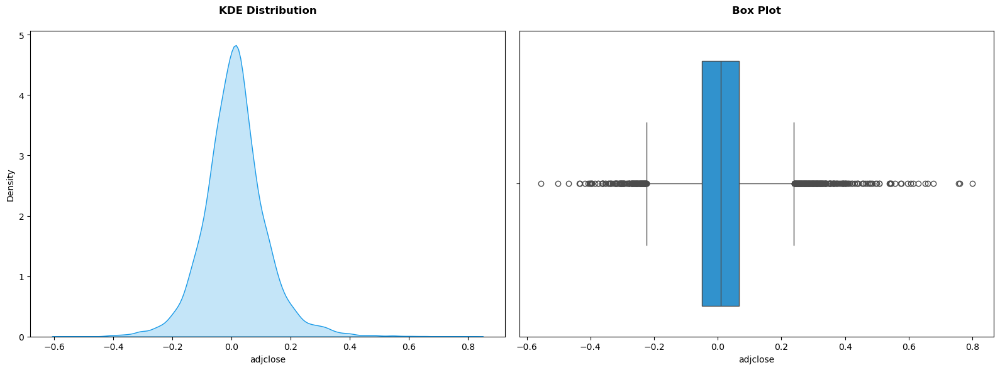

In [7]:
# Plot the distribution of the target
utils.plot.dist(df[target])

There are 2 long tails, and in this context steep drops in a stock price are more likely to be explained by the features than steep increases as very large increases (e.g. over 100%) are more likely to be due to news events or other external factors rather than the company's fundamentals. I'll winsorize the target to to mitigate the impact of these outliers.

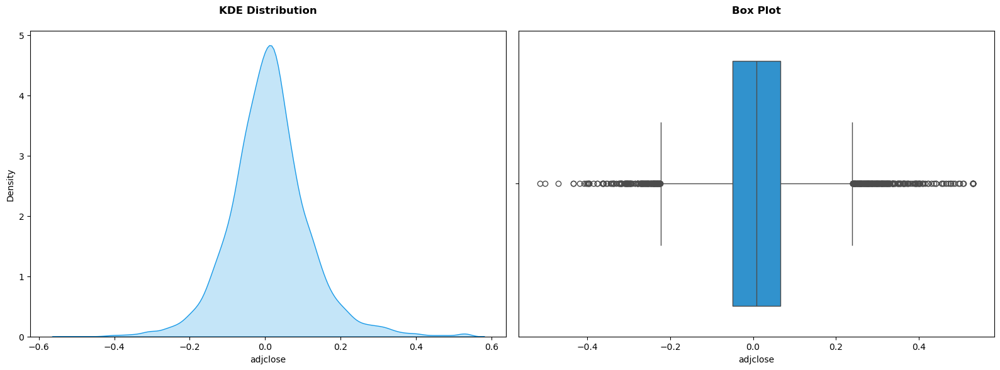

In [8]:
# Winsorize the target
df[target] = utils.stats.winsorize(df[target], 4)
utils.plot.dist(df[target])

### Outlier Identification

In [9]:
# Knee plot	
# Using the rule of thumb for n-features + 1
utils.outlier.knee_plot(df[features], n_neighbors=len(features) + 1)

In [10]:
outliers = utils.outlier.dbscan(df, features, eps=27.44, min_samples=len(features) + 1).query('labels == -1').drop(columns='labels')

print(outliers.shape)
display(outliers.head())

(18, 63)


,symbol,cap,GICS Sector,GICS Industry Group,GICS Industry,GICS Sub-Industry,date,adjclose,TotalRevenue,OperatingRevenue,NetIncome,BasicEPS,EBITDA,EBIT,Current Ratio,Quick Ratio,Gross Profit Margin,Net Profit Margin,Cash Flow Margin,Operating Margin,ROA,CROA,ROE,Efficiency Ratio,Inventory Turnover,Debt to Equity,Debt Ratio,Interest Coverage,Cash Flow to Debt,Assets to Equity,R&D to Revenue,Investment CF to OCF,Financing CF to OCF,FreeCashFlow,Capex,Book Value Per Share,Tangible Book Value Per Share,fed_funds,treasury_3mo,vix,gold,oil,silver,copper,aluminium,platinum,palladium,natural_gas,wheat,corn,soybean,coffee,sugar,cotton,cpi,unemployment,federal_budget_deficit,housing_starts,gdp_real,avg_home_price,30yr-15yr Mortgage Rate Spread,BAA-AAA Corporate Bond Spread,10yr-2yr Treasury Spread
12493,ASIX,small,Materials,Materials,Chemicals,Commodity Chemicals,2021-02-26,0.303940,0.207027,0.207027,39.676300,48.500000,2.068392,104.915855,-0.046729,0.004619,1.698413,33.042614,0.113588,1080.180420,38.810726,0.314049,37.665604,-0.095199,-2.716523,-0.127874,-0.100636,105.778275,0.461088,-0.030286,NaN,-0.403595,0.621966,0.655733,-0.037968,0.054728,0.056754,0.000000,-0.270833,-0.168814,-0.064527,0.178161,-0.018513,0.145795,0.101160,0.167457,0.050148,0.080733,-0.012066,0.015539,0.025730,0.113054,0.107391,0.089038,0.001742,-0.059701,-0.134229,-0.053325,NaN,NaN,0.024276,-0.037327,0.024570
15138,AXTA,mid,Materials,Materials,Chemicals,Specialty Chemicals,2020-05-29,0.170719,-0.104607,-0.104607,0.251799,0.222222,-0.226154,-0.411711,-0.093764,-0.143645,-0.029835,0.398043,-1.003154,-0.309540,0.335497,-1.003013,0.316032,0.033505,-1.496953,-0.042215,-0.028049,-0.353688,-1.003100,-0.014576,0.11014,1.005298,8492.072266,-1.096036,-0.411917,-0.050425,-0.004594,0.000000,0.422222,-0.216213,0.031291,0.883758,0.237750,0.030799,0.027494,0.075355,-0.009016,-0.051308,-0.016989,0.045746,-0.011173,-0.079790,0.050048,-0.008095,-0.007951,2.340909,-5.193923,-0.267270,NaN,NaN,0.029384,-0.069428,0.215625
26977,CF,large,Materials,Materials,Chemicals,Fertilizers & Agricultural Chemicals,2017-02-28,-0.102248,0.275000,0.275000,-9.666667,-9.615385,-2.880952,-1.660377,0.275562,0.245249,35.862743,-7.366013,-0.859364,2.338879,-10.019849,-0.814753,-10.468474,-0.329069,-31.303343,0.121359,0.077494,-0.254895,-0.828076,0.040711,NaN,0.798857,-0.007878,-0.240678,-0.109091,-0.069918,-0.359446,0.017857,0.046000,0.074704,0.036406,0.022723,0.051850,-0.006430,0.048442,0.036757,0.021674,-0.110042,0.009507,0.019458,0.000488,-0.059178,-0.055746,0.005204,0.004633,0.021277,2.862807,0.016313,NaN,NaN,0.001664,0.021024,-0.061945
29448,CLF,mid,Materials,Materials,Metals & Mining,Steel,2014-10-31,0.081888,0.310285,0.295275,-540.412842,-3848.000000,-0.968903,-1.958836,-0.241319,-0.269527,0.065559,-412.675995,5.151113,0.094628,-1469.989624,15.812479,20777.195312,-0.011786,1.389415,-37.212681,1.560186,-1.881376,6.785704,-15.144548,NaN,-6.256619,0.458546,2.545190,0.129508,-1.025964,-1.149500,0.000000,-0.769231,-0.150581,-0.032549,-0.116498,-0.054628,0.018466,0.053868,-0.047978,0.021292,-0.060180,0.114600,0.174591,0.145907,-0.027670,0.036176,0.040187,0.000863,-0.032787,NaN,0.063808,0.010315,0.074976,0.016071,0.030596,0.070471
29452,CLF,mid,Materials,Materials,Metals & Mining,Steel,2015-02-27,0.065421,0.311320,0.286728,0.781414,0.785659,-173.348312,-10.898594,0.227321,0.910870,-0.497857,0.833308,-0.147063,-0.484044,0.665842,0.709836,-0.977654,0.149299,0.131476,0.911013,0.330666,-9.834107,0.284948,0.933126,NaN,1.639127,-0.000070,0.283019,-0.261248,-8.776339,-1.858707,0.000000,0.600000,-0.452326,-0.051545,0.031509,-0.039495,0.074367,-0.097582,-0.042366,0.059208,0.015979,0.029339,0.039189,0.072581,-0.155343,-0.058147,0.090465,-0.006233,0.017857,NaN,-0.022039,NaN,NaN,0.008050,-0.076105,-0.149949


In [11]:
# Remove identified outliers
print(df.shape)
df = df.drop(outliers.index)
df.shape

(9306, 64)


(9288, 64)

### Feature Selection

#### Autocorrelation

I am most interested in the autocorrelation of the income/revenue derived features as there may be seasonality/cycles in the sector.

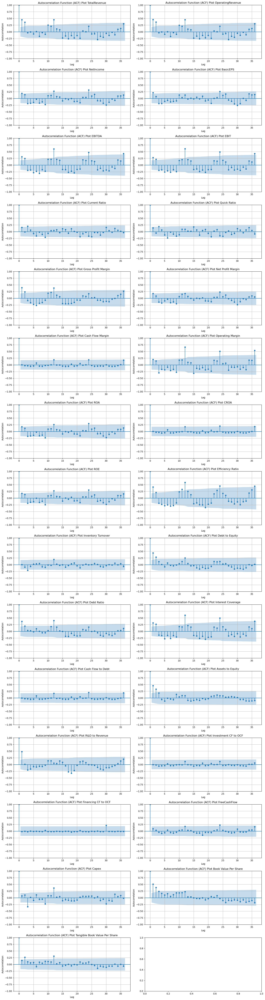

In [12]:
# ACF plot
utils.plot.acf(df, [feat for feat in features if feat not in utils.features_econ])

There are noticeable spikes in the ACF plots at the 12, 24, and 36 month lags for TotalRevenue, OperatingRevenue, NetIncome, BasicEPS, EBITDA, EBIT, Gross Profit Margin, Cash Flow Margin, Operating Margin, ROA, CROA, ROE, Efficiency Ratio, Debt Ratio, Interest Coverage, Cash Flow to Debt, R&D to Revenue, Investment CF to OCF, FreeCashFlow. This suggests that there is a yearly seasonality in these features.

In [13]:
df = df.sort_values(['symbol', 'date'])

# Features
seasonal_features = ['TotalRevenue', 'OperatingRevenue', 'NetIncome', 'BasicEPS', 'EBITDA', 'EBIT', 'Gross Profit Margin', 'Cash Flow Margin', 'Operating Margin', 'ROA', 'CROA', 'ROE', 'Efficiency Ratio', 'Debt Ratio', 'Interest Coverage', 'Cash Flow to Debt', 'R&D to Revenue', 'Investment CF to OCF', 'FreeCashFlow']

# Lag by 12 months
df = utils.lag_features(df, seasonal_features, 12)

features, lag_features = utils.features(df)

all_features = np.concatenate([features, lag_features])

#### Multicollinearity

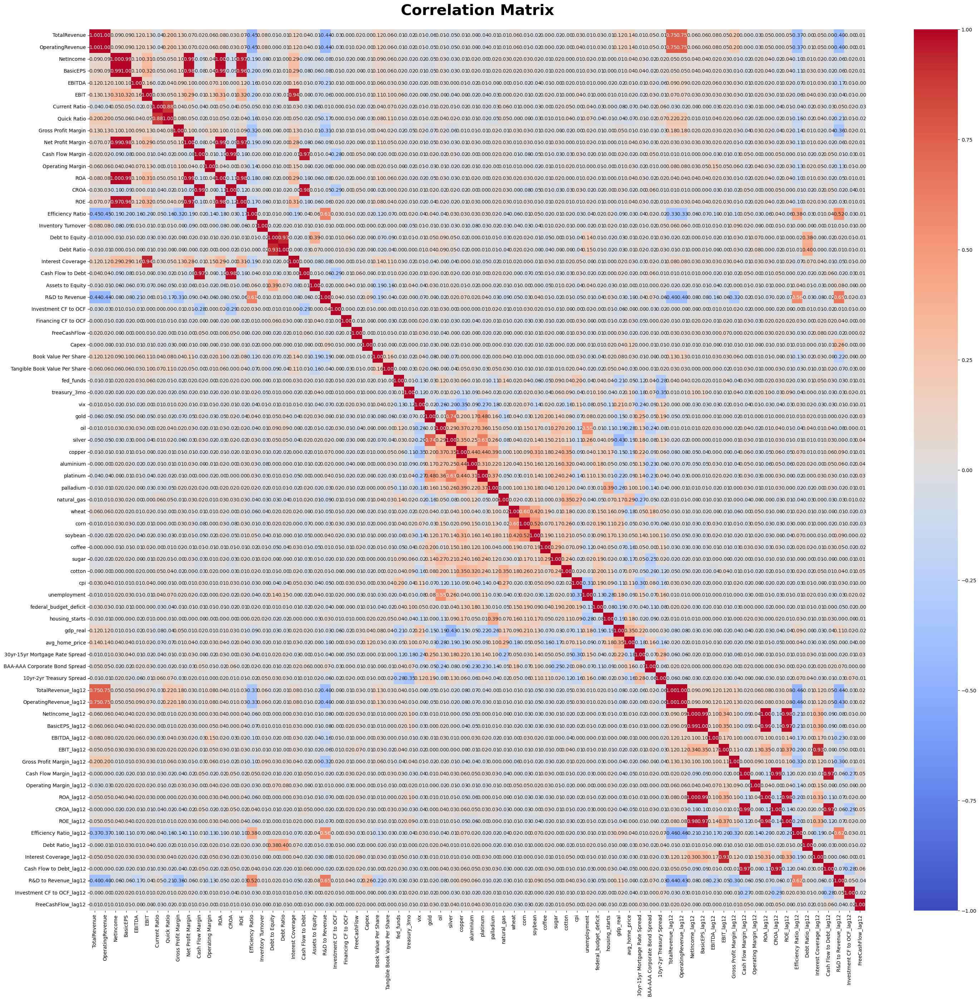

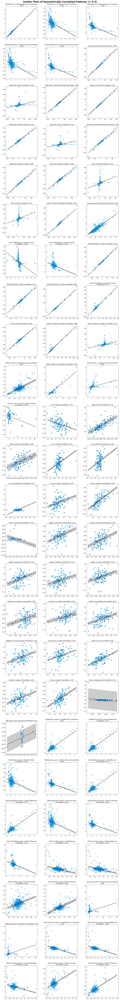



Asymmetrically Correlated Features: None with correlation >= 0.3.


In [14]:
utils.plot.correlation_matrix(df[all_features], lower_bound=0.3, sort=False, display_scatter=True)

In [15]:
vif = utils.stats.vif(df[all_features])
vif.query('VIF >= 5')

,Features,VIF
56,TotalRevenue_lag12,420.017497
57,OperatingRevenue_lag12,418.185702
13,ROA,407.505322
58,NetIncome_lag12,361.742661
1,TotalRevenue,352.217721
2,OperatingRevenue,350.285899
3,NetIncome,306.091785
65,ROA_lag12,299.316434
14,CROA,90.928638
59,BasicEPS_lag12,76.600148


### Modeling

#### Linear

Checking Features: [['NetIncome', 'ROA', 'BasicEPS', 'ROE', 'Net Profit Margin'], ['Debt Ratio', 'Debt to Equity', 'Assets to Equity'], ['TotalRevenue', 'OperatingRevenue'], ['EBIT', 'Interest Coverage'], ['Current Ratio', 'Quick Ratio'], ['Cash Flow Margin', 'CROA', 'Cash Flow to Debt'], ['Tangible Book Value Per Share', 'Book Value Per Share'], ['gold', 'silver', 'platinum'], ['copper', 'aluminium'], ['wheat', 'corn', 'soybean'], ['NetIncome_lag12', 'ROA_lag12', 'BasicEPS_lag12', 'ROE_lag12'], ['Debt Ratio_lag12'], ['TotalRevenue_lag12', 'OperatingRevenue_lag12'], ['EBIT_lag12', 'Interest Coverage_lag12'], ['Cash Flow Margin_lag12', 'CROA_lag12', 'Cash Flow to Debt_lag12']]
Baseline: 26.7624%


100%|██████████| 6/6 [00:00<00:00,  6.23it/s]


Keep: ()
Best Subset Gain: 0.1421%
Baseline: 26.9045%


100%|██████████| 4/4 [00:00<00:00,  6.50it/s]


Keep: ('Debt to Equity',)
Best Subset Gain: 0.2156%
Baseline: 27.1200%


100%|██████████| 3/3 [00:00<00:00,  6.68it/s]


Keep: ()
Best Subset Gain: 0.0771%
Baseline: 27.1972%


100%|██████████| 3/3 [00:00<00:00,  6.70it/s]


Keep: ()
Best Subset Loss: 0.0220%
Baseline: 27.1752%


100%|██████████| 3/3 [00:00<00:00,  6.78it/s]


Keep: ('Current Ratio',)
Best Subset Gain: 0.0273%
Baseline: 27.2025%


100%|██████████| 4/4 [00:00<00:00,  6.93it/s]


Keep: ('Cash Flow to Debt',)
Best Subset Loss: 0.0676%
Baseline: 27.1349%


100%|██████████| 3/3 [00:00<00:00,  6.88it/s]


Keep: ()
Best Subset Gain: 0.0830%
Baseline: 27.2179%


100%|██████████| 4/4 [00:00<00:00,  6.99it/s]


Keep: ('gold',)
Best Subset Loss: 0.2569%
Baseline: 26.9610%


100%|██████████| 3/3 [00:00<00:00,  7.03it/s]


Keep: ('copper',)
Best Subset Loss: 0.0149%
Baseline: 26.9461%


100%|██████████| 4/4 [00:00<00:00,  7.04it/s]


Keep: ('soybean',)
Best Subset Loss: 0.3538%
Baseline: 26.5923%


100%|██████████| 5/5 [00:00<00:00,  7.15it/s]


Keep: ('ROE_lag12',)
Best Subset Gain: 0.0630%
Baseline: 26.6553%


100%|██████████| 2/2 [00:00<00:00,  7.36it/s]


Keep: ('Debt Ratio_lag12',)
Best Subset Gain: 0.0000%
Baseline: 26.6553%


100%|██████████| 3/3 [00:00<00:00,  7.33it/s]


Keep: ()
Best Subset Gain: 0.0136%
Baseline: 26.6689%


100%|██████████| 3/3 [00:00<00:00,  7.36it/s]


Keep: ()
Best Subset Gain: 0.2216%
Baseline: 26.8905%


100%|██████████| 4/4 [00:00<00:00,  7.47it/s]


Keep: ('Cash Flow to Debt_lag12',)
Best Subset Gain: 0.0045%
Initial r2 score: 26.8950%
Initial mae score: 6.6221%
New r2 score: 27.4157%
New mae score: 6.5984%


,Median,Mean,STD,Min,Max
R2,27.62%,27.42%,0.53%,26.51%,28.08%
Adjusted R2,27.39%,27.18%,0.53%,26.27%,27.85%
MSE,0.83%,0.84%,0.06%,0.74%,0.94%
RMSE,9.09%,9.14%,0.35%,8.62%,9.72%
MAE,6.58%,6.60%,0.20%,6.27%,6.87%
F-stat,118.77,119.13,9.08,108.88,132.75
P>F,0.0000,0.0000,0.0000,0.0000,0.0000


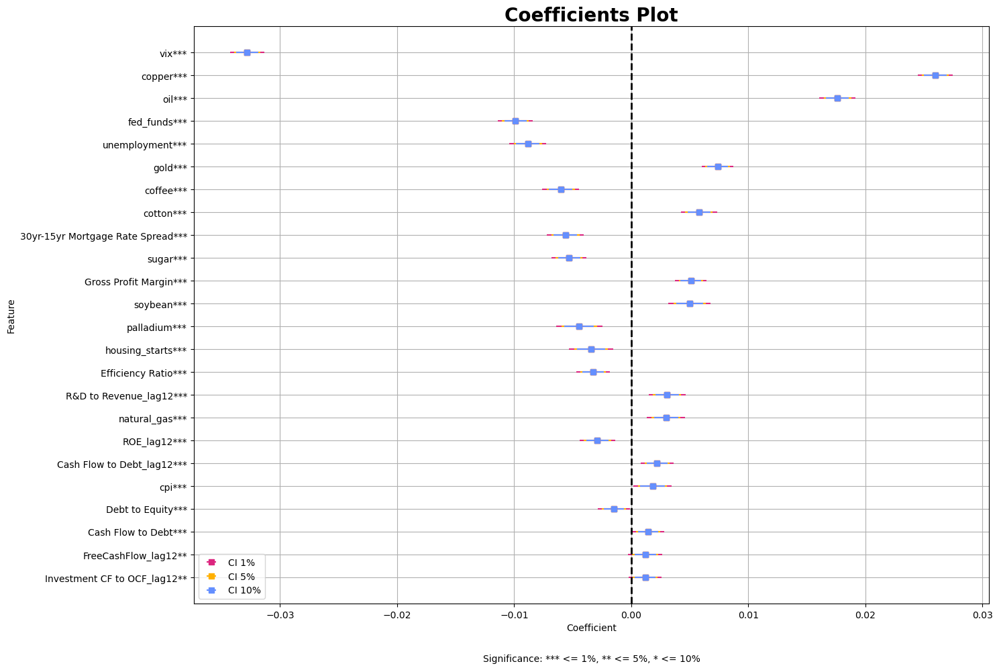

In [16]:
from cuml.preprocessing import SimpleImputer, StandardScaler
# from sklearn.feature_selection import RFECV
from cuml.linear_model import LinearRegression
from lightgbm.sklearn import LGBMRegressor
from cuml.pipeline import Pipeline
from utils import Evaluate, MulticollinearityCV, CustomCV, cross_val_score, RFECV

cv = CustomCV(mask=df['EBITDA'])

X = df[all_features].copy()
y = df[target].copy()

preprocessor = Pipeline(steps=[
	('imputer', SimpleImputer(strategy='constant', fill_value=0)),
	('scaler', StandardScaler())
])

# Create a pipeline (Linear)
pipeline_linear = Pipeline(steps=[
	('preprocessor', preprocessor),
	('model', LinearRegression(copy_X=True, fit_intercept=True, normalize=False))
])

# Multicollinearity
mc = MulticollinearityCV(pipeline_linear, cv)
mc.fit(X, y)
X_linear = X[mc.selected_features_].copy()
del mc
# RFE
rfe = RFECV(pipeline_linear, cv=cv, scoring='r2')
rfe.fit(X_linear, y)
# Unsupport features
unsupport = rfe.support_.query('Support == False')
X_linear.drop(columns=unsupport.index.to_list(), inplace=True)
del rfe, unsupport

# Evaluate the model
evaluate_linear = Evaluate(pipeline_linear, cv)
evaluate_linear.fit(X_linear, y)
display(evaluate_linear.metrics_cv_)
evaluate_linear.importance_plot()

#### LightGBM

Checking Features: [['NetIncome', 'ROA', 'BasicEPS', 'ROE', 'Net Profit Margin'], ['Debt Ratio', 'Debt to Equity', 'Assets to Equity'], ['TotalRevenue', 'OperatingRevenue'], ['EBIT', 'Interest Coverage'], ['Current Ratio', 'Quick Ratio'], ['Cash Flow Margin', 'CROA', 'Cash Flow to Debt'], ['Tangible Book Value Per Share', 'Book Value Per Share'], ['gold', 'silver', 'platinum'], ['copper', 'aluminium'], ['wheat', 'corn', 'soybean'], ['NetIncome_lag12', 'ROA_lag12', 'BasicEPS_lag12', 'ROE_lag12'], ['Debt Ratio_lag12'], ['TotalRevenue_lag12', 'OperatingRevenue_lag12'], ['EBIT_lag12', 'Interest Coverage_lag12'], ['Cash Flow Margin_lag12', 'CROA_lag12', 'Cash Flow to Debt_lag12']]
Baseline: 35.6908%


100%|██████████| 6/6 [00:10<00:00,  1.75s/it]


Keep: ('Net Profit Margin',)
Best Subset Gain: 0.4393%
Baseline: 36.1301%


100%|██████████| 4/4 [00:06<00:00,  1.71s/it]


Keep: ('Debt Ratio',)
Best Subset Loss: 0.2744%
Baseline: 35.8534%


100%|██████████| 3/3 [00:05<00:00,  1.70s/it]


Keep: ()
Best Subset Gain: 0.0076%
Baseline: 35.8618%


100%|██████████| 3/3 [00:05<00:00,  1.71s/it]


Keep: ('EBIT',)
Best Subset Loss: 0.1739%
Baseline: 35.6863%


100%|██████████| 3/3 [00:05<00:00,  1.70s/it]


Keep: ()
Best Subset Gain: 0.3052%
Baseline: 35.9920%


100%|██████████| 4/4 [00:06<00:00,  1.70s/it]


Keep: ('Cash Flow to Debt',)
Best Subset Gain: 0.2778%
Baseline: 36.2697%


100%|██████████| 3/3 [00:05<00:00,  1.69s/it]


Keep: ('Tangible Book Value Per Share',)
Best Subset Loss: 0.4678%
Baseline: 35.8016%


100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


Keep: ()
Best Subset Gain: 0.2854%
Baseline: 36.0895%


100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


Keep: ()
Best Subset Gain: 0.1047%
Baseline: 36.1940%


100%|██████████| 4/4 [00:06<00:00,  1.62s/it]


Keep: ('soybean',)
Best Subset Loss: 0.0486%
Baseline: 36.1473%


100%|██████████| 5/5 [00:08<00:00,  1.61s/it]


Keep: ('BasicEPS_lag12',)
Best Subset Gain: 0.0378%
Baseline: 36.1836%


100%|██████████| 2/2 [00:03<00:00,  1.60s/it]


Keep: ('Debt Ratio_lag12',)
Best Subset Gain: 0.0008%
Baseline: 36.1838%


100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


Keep: ('TotalRevenue_lag12',)
Best Subset Loss: 0.0839%
Baseline: 36.0998%


100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


Keep: ('Interest Coverage_lag12',)
Best Subset Gain: 0.2745%
Baseline: 36.3742%


100%|██████████| 4/4 [00:06<00:00,  1.60s/it]


Keep: ('CROA_lag12',)
Best Subset Gain: 0.0608%
Initial r2 score: 36.4357%
Initial mae score: 6.1287%
New r2 score: 36.5817%
New mae score: 6.1168%


,Median,Mean,STD,Min,Max
R2,36.34%,36.58%,1.52%,34.41%,39.14%
Adjusted R2,35.96%,36.21%,1.53%,34.02%,38.78%
MSE,0.72%,0.73%,0.07%,0.63%,0.84%
RMSE,8.50%,8.54%,0.40%,7.93%,9.18%
MAE,6.12%,6.12%,0.23%,5.73%,6.43%
F-stat,101.20,100.42,8.03,89.78,113.30
P>F,0.0000,0.0000,0.0000,0.0000,0.0000


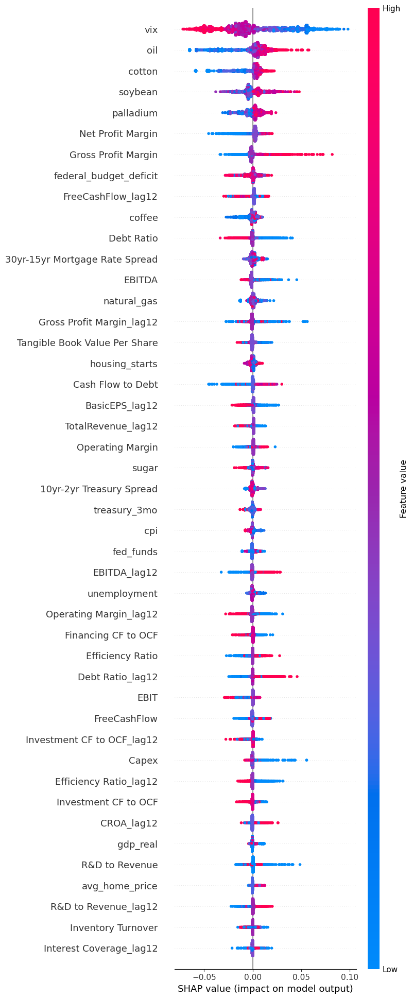

In [17]:
# Create a pipeline (LGBM)
pipeline_gbt = Pipeline(steps=[
	('preprocessor', preprocessor),
	('model', LGBMRegressor(device='gpu', random_state=42, verbose=-1))
])

# Multicollinearity
mc = MulticollinearityCV(pipeline_gbt, cv=cv)
mc.fit(X, y)
X_gbt = X[mc.selected_features_].copy()
del mc
# RFE
rfe = RFECV(pipeline_gbt, cv=cv, scoring='r2')
rfe.fit(X_gbt, y)
# Unsupport features
unsupport = rfe.support_.query('Support == False')
X_gbt.drop(columns=unsupport.index.to_list(), inplace=True)
del rfe, unsupport

# Evaluate LightGBM
evaluate_gbt = Evaluate(pipeline_gbt, cv)
evaluate_gbt.fit(X_gbt, y)
display(evaluate_gbt.metrics_cv_)
evaluate_gbt.shap_plot()

#### Tuning

I'll use a Randomized Search to tune the hyperparameters of the models.

The LightGBM model especially could benefit from tuning while the linear model is likely to be less impacted, although Elastic Net may yield some benefits through stablizing coefficients and penalizing any remaining multicollinearity.

##### Linear

In [18]:
from cuml.linear_model import ElasticNet
from utils import Tuner

# Base line scores
print('Linear Score (Base):', np.mean(cross_val_score(pipeline_linear, X_linear, y, cv=cv, scoring='r2')))
print('Linear MAE (Base):', np.mean(cross_val_score(pipeline_linear, X_linear, y, cv=cv, scoring='mae')))

# Tune Linear
try:
	best_params = Tuner.load_params(f'model/{SECTOR}/linear_params.pkl')
except:
	tuner = Tuner(ElasticNet(), preprocessor, Tuner.elasticnet_param_dist, cv=cv, n_iter=20000, random_state=42, verbose=1, scoring='r2')
	tuner.fit(X_linear, y).save_params(f'model/{SECTOR}/linear_params.pkl')
	print('Linear Best Params:', tuner.best_params_)
	best_params = tuner.best_params_
	del tuner

# New Linear Pipeline
pipeline_linear = Pipeline(steps=[
	('preprocessor', preprocessor),
	('model', ElasticNet(**best_params))
])

# Score of Regression
print('Linear Score:', np.mean(cross_val_score(pipeline_linear, X_linear, y, cv=cv, scoring='r2')))
print('Linear MAE:', np.mean(cross_val_score(pipeline_linear, X_linear, y, cv=cv, scoring='mae')))

Linear Score (Base): 0.2741573372129216
Linear MAE (Base): 0.06598418839461315
Linear Score: 0.2741795563828651
Linear MAE: 0.06597399709023244


##### LightGBM

In [19]:
# Base scores
print('LightGBM Score (Base):', np.mean(cross_val_score(pipeline_gbt, X_gbt, y, cv=cv, scoring='r2')))
print('LightGBM MAE (Base):', np.mean(cross_val_score(pipeline_gbt, X_gbt, y, cv=cv, scoring='mae')))

# Tune LightGBM
try:
	best_params = Tuner.load_params(f'model/{SECTOR}/gbt_params.pkl')
except:
	tuner = Tuner(pipeline_gbt[-1], preprocessor, Tuner.gbt_param_dist, cv=cv, n_iter=200, random_state=42, verbose=1, scoring='r2')
	tuner.fit(X_gbt, y).save_params(f'model/{SECTOR}/gbt_params.pkl')
	best_params = tuner.best_params_
	del tuner

print('LightGBM Best Params:', best_params)

# New LightGBM Pipeline
pipeline_gbt = Pipeline(steps=[
	('preprocessor', preprocessor),
	('model', LGBMRegressor(**best_params))
])

# Score of the tree model
print('LightGBM Score:', np.mean(cross_val_score(pipeline_gbt, X_gbt, y, cv=cv, scoring='r2')))
print('LightGBM MAE:', np.mean(cross_val_score(pipeline_gbt, X_gbt, y, cv=cv, scoring='mae')))

LightGBM Score (Base): 0.36586399699229794
LightGBM MAE (Base): 0.06116589054954073
LightGBM Best Params: {'colsample_bytree': 0.5670076142253204, 'device': 'gpu', 'learning_rate': 0.015391338156669487, 'max_depth': 17, 'min_child_samples': 33, 'min_child_weight': 0.07140797680992236, 'n_estimators': 484, 'num_leaves': 44, 'random_state': 42, 'reg_alpha': 0.13637147558676976, 'reg_lambda': 0.014544665667881929, 'subsample': 0.6752937794032985, 'verbose': -1}
LightGBM Score: 0.3676914245456588
LightGBM MAE: 0.060995198441564626


The base models were already performing quite close to the tuned model, regularization terms were tuned which may lead to more stable coefficients and a more interpretable model.

#### Evaluation

##### Linear

,Median,Mean,STD,Min,Max
R2,27.62%,27.42%,0.53%,26.51%,28.09%
Adjusted R2,27.39%,27.18%,0.53%,26.27%,27.86%
MSE,0.83%,0.84%,0.06%,0.74%,0.94%
RMSE,9.09%,9.14%,0.35%,8.62%,9.72%
MAE,6.58%,6.60%,0.20%,6.27%,6.87%
F-stat,117.95,118.28,9.03,108.10,131.85
P>F,0.0000,0.0000,0.0000,0.0000,0.0000


,Score
R2,27.81%
Adjusted R2,27.62%
MSE,0.83%
RMSE,9.12%
MAE,6.58%
F-stat,147.62
P>F,0.0000


findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeOneSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeTwoSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeThreeSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFourSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFiveSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmsy10'] not

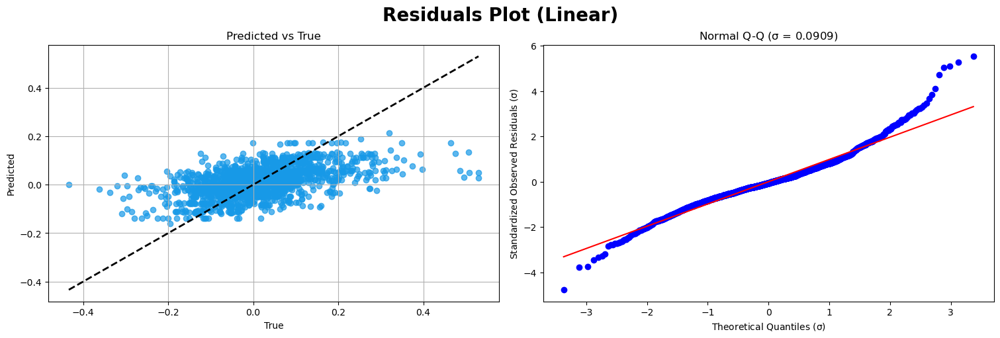

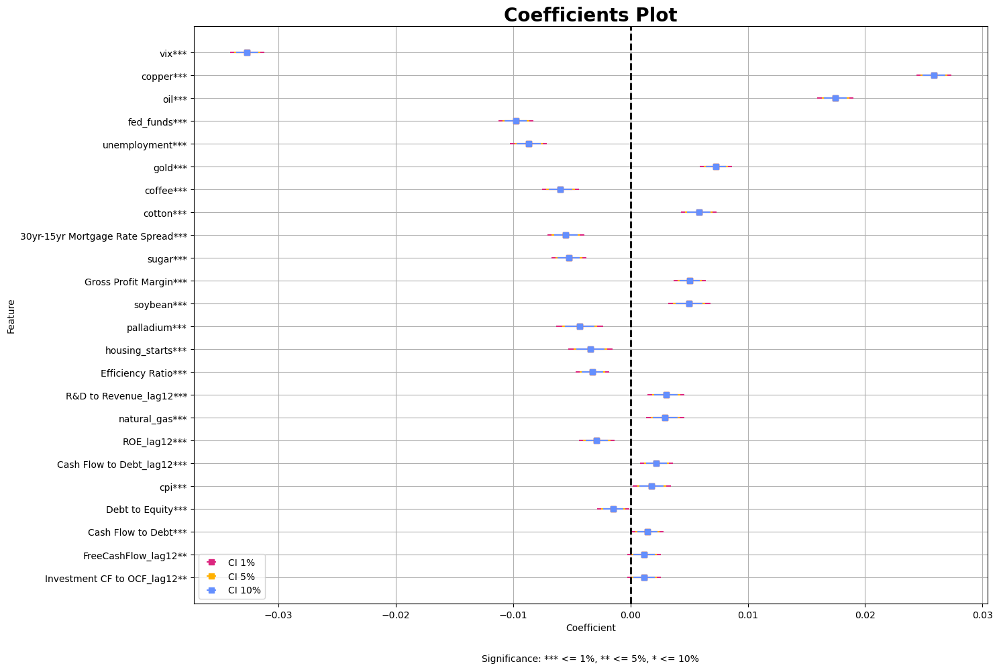

,Coef,Std Err,|t|,P>|t|,t* (10%),CI (10%),t* (5%),CI (5%),t* (1%),CI (1%)
vix***,-0.032670,0.000573,56.996400,0.000000e+00,1.645059,0.000943,1.960284,0.001124,2.576493,0.001477
copper***,0.025858,0.000585,44.215908,0.000000e+00,1.645059,0.000962,1.960284,0.001146,2.576493,0.001507
oil***,0.017464,0.000598,29.209475,0.000000e+00,1.645059,0.000984,1.960284,0.001172,2.576493,0.001540
fed_funds***,-0.009781,0.000579,16.883030,0.000000e+00,1.645059,0.000953,1.960284,0.001136,2.576493,0.001493
unemployment***,-0.008679,0.000610,14.216847,0.000000e+00,1.645059,0.001004,1.960284,0.001197,2.576493,0.001573
gold***,0.007280,0.000531,13.711729,0.000000e+00,1.645059,0.000873,1.960284,0.001041,2.576493,0.001368
coffee***,-0.005962,0.000615,9.701652,0.000000e+00,1.645059,0.001011,1.960284,0.001205,2.576493,0.001583
cotton***,0.005821,0.000597,9.753867,0.000000e+00,1.645059,0.000982,1.960284,0.001170,2.576493,0.001538
30yr-15yr Mortgage Rate Spread***,-0.005526,0.000610,9.058539,0.000000e+00,1.645059,0.001004,1.960284,0.001196,2.576493,0.001572
sugar***,-0.005263,0.000581,9.057284,0.000000e+00,1.645059,0.000956,1.960284,0.001139,2.576493,0.001497


In [20]:
from utils import Evaluate

# Linear
# Calculate the metrics
evaluate_linear = Evaluate(pipeline_linear, cv)
evaluate_linear.fit(X_linear, y)
# Drop insignificant features
X_linear = X_linear.drop(columns=evaluate_linear.linear_stats().query('`P>|t|` > 0.1').index)
evaluate_linear.fit(X_linear, y)
display(evaluate_linear.metrics_cv_)
display(evaluate_linear.metrics_)
evaluate_linear.residuals_plot(title='Residuals Plot (Linear)')
evaluate_linear.importance_plot()
evaluate_linear.linear_stats()

##### LightGBM

,Median,Mean,STD,Min,Max
R2,36.35%,36.77%,1.12%,35.60%,38.86%
Adjusted R2,35.97%,36.39%,1.13%,35.22%,38.50%
MSE,0.73%,0.73%,0.06%,0.63%,0.83%
RMSE,8.52%,8.53%,0.37%,7.95%,9.09%
MAE,6.12%,6.10%,0.21%,5.74%,6.36%
F-stat,97.11,96.36,7.73,86.59,109.59
P>F,0.0000,0.0000,0.0000,0.0000,0.0000


,Score
R2,53.80%
Adjusted R2,53.58%
MSE,0.53%
RMSE,7.30%
MAE,5.15%
F-stat,180.76
P>F,0.0000


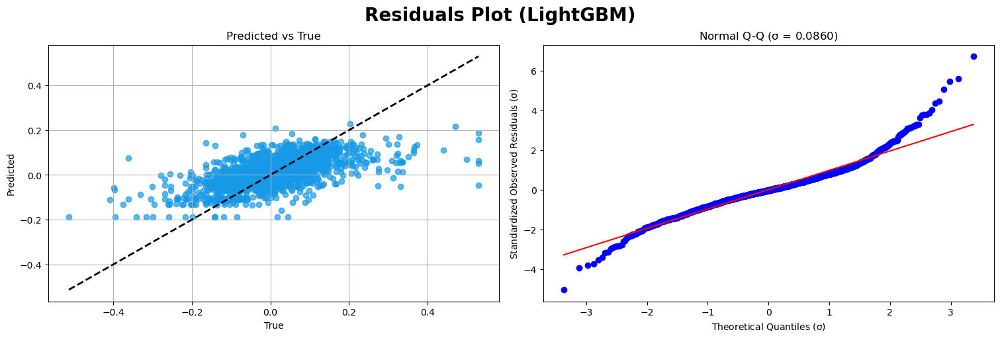

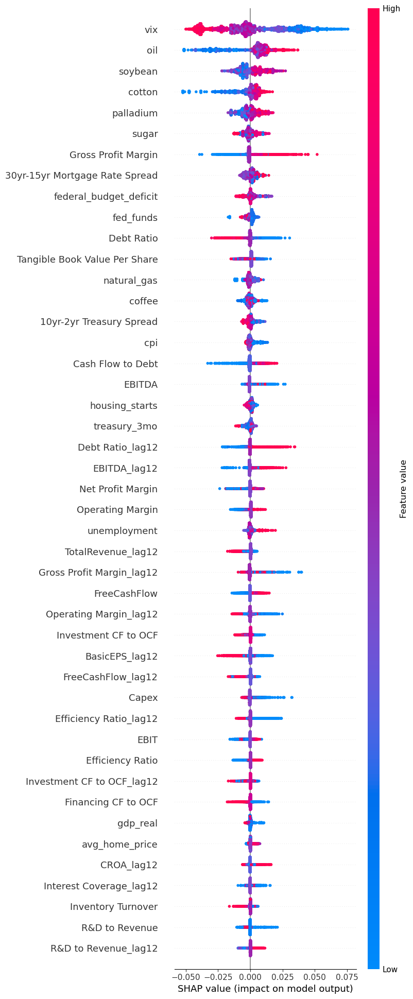

In [21]:
# LightGBM
# Calculate the metrics
evaluate_gbt = Evaluate(pipeline_gbt, cv)
evaluate_gbt.fit(X_gbt, y)
display(evaluate_gbt.metrics_cv_)
display(evaluate_gbt.metrics_)
evaluate_gbt.residuals_plot('Residuals Plot (LightGBM)')
evaluate_gbt.shap_plot()

---